In [1]:
import numpy as np
import matplotlib.pyplot as plt
import collections
import os
import random
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dropout, Lambda
from tensorflow.keras.layers import Conv2D, Conv2DTranspose,Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import concatenate
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler, Callback

## Load dataset, train, validation and test

In [2]:
images_1 = np.load('data/Fold 1/images/fold1/images.npy').astype(np.uint8) 
masks_1 = np.load('data/Fold 1/masks/fold1/masks.npy').astype(np.uint8) 
images_2 = np.load('data/Fold 2/images/fold2/images.npy',mmap_mode='r').astype(np.uint8) 
masks_2 = np.load('data/Fold 2/masks/fold2/masks.npy').astype(np.uint8) 
images_3 = np.load('data/Fold 3/images/fold3/images.npy',mmap_mode='r').astype(np.uint8) 
masks_3 = np.load('data/Fold 3/masks/fold3/masks.npy').astype(np.uint8) 
types_1 = np.load('data/Fold 1/images/fold1/types.npy')
types_2 = np.load('data/Fold 2/images/fold2/types.npy')
types_3 = np.load('data/Fold 3/images/fold3/types.npy')
print("shape images:", images_1.shape)
print("types images:", types_1.shape)
print("masks images:", masks_1.shape)

shape images: (2656, 256, 256, 3)
types images: (2656,)
masks images: (2656, 256, 256, 6)


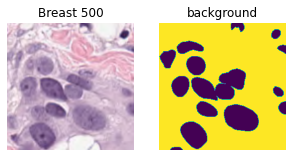

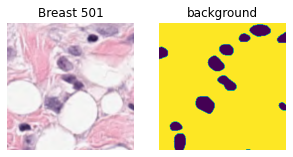

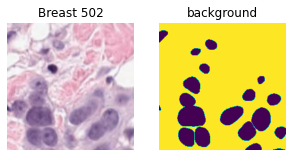

In [11]:
maskNames = ["neoplastic", "inflammatory", "connective", "dead", "epithelial", "background"]
def plot_images_mask(i, images, masks, figsize = (5,5)):
    global maskNames
    global types_1
    plt.figure(figsize=figsize)
    plt.subplot(121)
    plt.imshow(images[i])
    plt.title(types_1[i] + " " + str(i))
    plt.axis("off")
    
    plt.subplot(122)
    plt.imshow(masks[i,:,:,5])
    plt.title(maskNames[5])
    plt.axis("off")
        
    plt.show()

for i in range(500, 503):
    plot_images_mask(i, images_1, masks_1)

In [14]:
x = images_1
y = masks_1[:,:,:,5]
y = np.where((y==0)|(y==1), y^1, y) # convert 0 to 1; 1 to 0
# Number of images
nox, width, height = x.shape[0], x.shape[1], x.shape[2]
# Compute number, width and height of images
 
print("Train folder images size: %dx%dx%d" % (nox,width,height))

# reshape y to the right shape for modeling
y = y.reshape(nox,width,height, 1)
print(y.shape)


Train folder images size: 2656x256x256
(2656, 256, 256, 1)


In [3]:
x = images_1
y = masks_1[:,:,:,5]
y = np.where((y==0)|(y==1), y^1, y) # convert 0 to 1; 1 to 0
# Number of images
nox, width, height = x.shape[0], x.shape[1], x.shape[2]
# Compute number, width and height of images
 
print("Image size: %dx%dx%d" % (nox,width,height))

# reshape y to the right shape for modeling
y = y.reshape(nox,width,height, 1)
print(y.shape)

#train_percentage=0.7
#train_percentage=1
#n_train = int(train_percentage*no_img)
#x_train = x[0:n_train]
#x_val   = x[n_train:]
#y_train = y[0:n_train]
#y_val   = y[n_train:]
#print(x_train.shape)
#print(x_val.shape)
#print(y_train.shape)
#print(y_val.shape)


Number of images : 2656 	 
Image size: 256x256
(2656, 256, 256, 1)
(1859, 256, 256, 3)
(797, 256, 256, 3)
(1859, 256, 256, 1)
(797, 256, 256, 1)


In [16]:
val_x= images_2
val_y = masks_2[:,:,:,5]
val_y = np.where((val_y==0)|(val_y==1), val_y^1, val_y) # convert 0 to 1; 1 to 0


# Number of images
noval, width, height = val_x.shape[0], val_x.shape[1], val_x.shape[2]

val_y = val_y.reshape(noval, width, height, 1)

test_x= images_3
test_y = masks_3[:,:,:,5]
test_y = np.where((test_y==0)|(test_y==1), test_y^1, test_y) # convert 0 to 1; 1 to 0
    
notest, width, height = test_x.shape[0], test_x.shape[1], test_x.shape[2]

test_y = test_y.reshape(notest, width, height, 1)

train_x=x
train_y=y


In [17]:
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2.0 * intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) + 1.0)

#y_pred is predicted probability of classes 
def dice_coef_numpy(y_true,y_pred):
    y_true_f = K.flatten(y_true).numpy()
    y_pred_f= K.flatten((y_pred>0.5).astype('uint8')).numpy()
    intersection=sum(y_true_f*y_pred_f)
    k=(sum(y_true_f) + sum(y_pred_f))
    return (2.0*intersection+1.0)/ (k+1)

In [6]:
from tensorflow.keras.optimizers import Adam
#Used UNet architecture for which c is convolution layer, d is dropout, 
#p is pooling layer, u for transpose
opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
def unet(width=256,height=256,chan=3):
    inp = Input((width, height, chan))
    norm = Lambda(lambda x: x / 255) (inp)
    c1 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (norm)
    d1 = Dropout(0.1) (c1)
    c2 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d1)
    p1 = MaxPooling2D((2, 2)) (c2)
    c3 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p1)
    d2 = Dropout(0.1) (c3)
    c4 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d2)
    p2 = MaxPooling2D((2, 2)) (c4)

    c5 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p2)
    d3 = Dropout(0.2) (c5)
    c6 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d3)
    p3 = MaxPooling2D((2, 2)) (c6)

    c7 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p3)
    d4 = Dropout(0.2) (c7)
    c8 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d4)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c8)

    c9 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (p4)
    d5 = Dropout(0.3) (c9)
    c10 = Conv2D(256, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d5)

    u1 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c9)
    u2 = concatenate([u1, c8])
    u3 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u2)
    d6 = Dropout(0.2) (u3)
    u4 = Conv2D(128, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d6)

    u5 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (u4)
    u6 = concatenate([u5, c6])
    u7 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u6)
    d7 = Dropout(0.2) (u7)
    u8 = Conv2D(64, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d7)

    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (u8)
    u10 = concatenate([u9, c4])
    u11 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u10)
    d8 = Dropout(0.1) (u11)
    u12 = Conv2D(32, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d8)

    u13 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (u12)
    u14 = concatenate([u13, c2], axis=3)
    u15 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (u14)
    d9 = Dropout(0.1) (u15)
    u16 = Conv2D(16, (3, 3), activation='elu', kernel_initializer='he_normal', padding='same') (d9)

    out = Conv2D(1, (1, 1), activation='sigmoid') (u16)

    model = Model(inputs=[inp], outputs=[out])
    
    return model

In [14]:
from tensorflow.keras import models
model4 = unet()
opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
model4.compile(optimizer=opt,loss='binary_crossentropy', metrics=[dice_coef])
history4 = model4.fit(train_x, 
          train_y, 
          steps_per_epoch = n_train//32, 
          batch_size = 32,
          epochs =100, 
          shuffle=True, 
          initial_epoch=0, 
          validation_data = (val_x, val_y))

Epoch 1/100
58/58 [==============================] - 409s 7s/step - loss: 0.3726 - dice_coef: 0.4107 - val_loss: 0.3427 - val_dice_coef: 0.4805
Epoch 2/100
58/58 [==============================] - 407s 7s/step - loss: 0.3324 - dice_coef: 0.4740 - val_loss: 0.3471 - val_dice_coef: 0.4321
Epoch 3/100
58/58 [==============================] - 408s 7s/step - loss: 0.2891 - dice_coef: 0.5319 - val_loss: 0.3172 - val_dice_coef: 0.5364
Epoch 4/100
58/58 [==============================] - 408s 7s/step - loss: 0.2823 - dice_coef: 0.5546 - val_loss: 0.2952 - val_dice_coef: 0.5707
Epoch 5/100
58/58 [==============================] - 409s 7s/step - loss: 0.2718 - dice_coef: 0.5599 - val_loss: 0.2939 - val_dice_coef: 0.5543
Epoch 6/100
58/58 [==============================] - 410s 7s/step - loss: 0.2706 - dice_coef: 0.5620 - val_loss: 0.2720 - val_dice_coef: 0.6023
Epoch 7/100
58/58 [==============================] - 413s 7s/step - loss: 0.2555 - dice_coef: 0.5890 - val_loss: 0.2756 - val_dice_coef:

In [15]:
tra_loss1 = history4.history['loss']
tra_dice_coef = history4.history['dice_coef']
val_loss1 = history4.history['val_loss']
val_dice_coef = history4.history['val_dice_coef']

# Total number of epochs training
epochs1 = range(1, len(tra_dice_coef)+1)
end_epoch1 = len(tra_dice_coef)

# Epoch when reached the validation loss minimum
opt_epoch1 = val_loss1.index(min(val_loss1)) + 1

# Loss and accuracy on the validation set
opt_val_loss1 = val_loss1[opt_epoch1-1]
opt_val_dice_coef = val_dice_coef[opt_epoch1-1]
print("Model 1\n")
print("Epoch [opt]: %d" % opt_epoch1)
print("Valid dice coef [opt]: %.4f" % opt_val_dice_coef)
# print("Test dice coef [opt]:  %.4f" % opt_test_dice_coef)
print("Valid loss [opt]: %.4f" % opt_val_loss1)
# print("Test loss [opt]:  %.4f" % opt_test_loss1)


Model 1

Epoch [opt]: 73
Valid dice coef [opt]: 0.7272
Valid loss [opt]: 0.1796


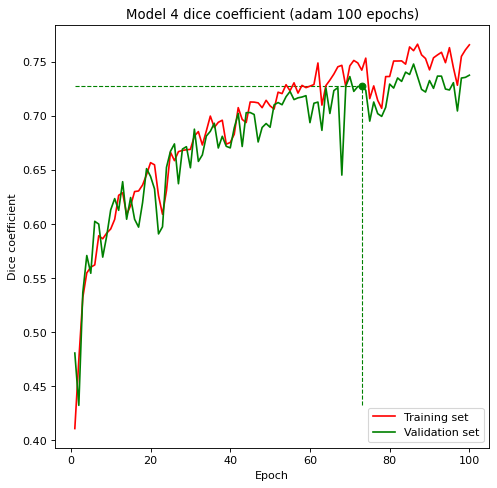

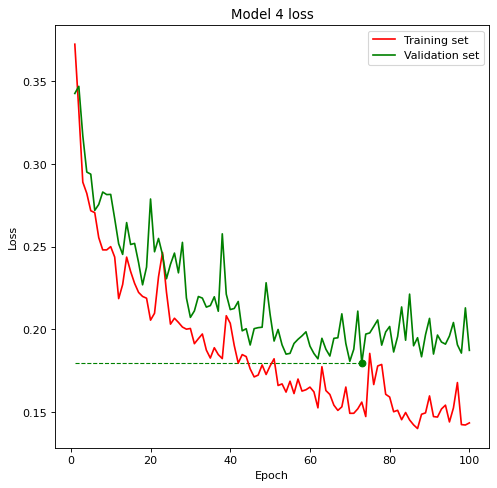

In [60]:
plt.figure(figsize=(7, 7), dpi=80, facecolor='w', edgecolor='k')
plt.title('Model 4 dice coefficient (adam 100 epochs)')
plt.ylabel('Dice coefficient')
plt.xlabel('Epoch')
plt.plot(epochs1, tra_dice_coef, 'r', label='Training set')
plt.plot(epochs1, val_dice_coef, 'g', label='Validation set')
plt.plot(opt_epoch1, val_dice_coef[opt_epoch1-1], 'go')
plt.vlines(opt_epoch1, min(val_dice_coef), opt_val_dice_coef, linestyle="dashed", color='g', linewidth=1)
plt.hlines(opt_val_dice_coef, 1, opt_epoch1, linestyle="dashed", color='g', linewidth=1)
plt.legend(loc='lower right')

# Model loss
plt.figure(figsize=(7, 7), dpi=80, facecolor='w', edgecolor='k')
plt.title('Model 4 loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.plot(epochs1, tra_loss1, 'r', label='Training set')
plt.plot(epochs1, val_loss1, 'g', label='Validation set')
plt.plot(opt_epoch1, val_loss1[opt_epoch1-1], 'go')
plt.vlines(opt_epoch1, min(val_loss1), opt_val_loss1, linestyle="dashed", color='g', linewidth=1)
plt.hlines(opt_val_loss1, 1, opt_epoch1, linestyle="dashed", color='g', linewidth=1)
plt.legend();

In [19]:
pred4 = model4.predict(test_x,verbose=1)


86/86 [==============================] - 107s 1s/step


## Compare subtype dice coefficients

In [20]:
test_n=len(test_y)
total_dice4=0
for i in range(test_n):
    total_dice4+=dice_coef_numpy(test_y[i],pred4[i])
print(total_dice4/test_n)
type_dices4={}
for types in np.unique(types_3):
    n_images=len(np.where(types_3==types)[0])
    type_dice4=0
    for i in np.where(types_3==types)[0]:    
        type_dice4+=dice_coef_numpy(test_y[i],pred4[i])
    type_dices4[types]=type_dice4/n_images
print(type_dices4)
dices4=list(type_dices4.values())
dices4.append(total_dice4/test_n)
dices4

0.7868116702357872
{'Adrenal_gland': 0.7997986620149197, 'Bile-duct': 0.7725961695966913, 'Bladder': 0.7456123580494347, 'Breast': 0.8181756566137478, 'Cervix': 0.8209715670034727, 'Colon': 0.7262616330667871, 'Esophagus': 0.82210872388865, 'HeadNeck': 0.704653065986198, 'Kidney': 0.7341238623202525, 'Liver': 0.8401696179769361, 'Lung': 0.7941977394910361, 'Ovarian': 0.8352942985398181, 'Pancreatic': 0.8247994605727857, 'Prostate': 0.8039488157788164, 'Skin': 0.7107111209033139, 'Stomach': 0.8541930011116462, 'Testis': 0.7642923742282247, 'Thyroid': 0.8041855554892604, 'Uterus': 0.8152545572575406}


[0.7997986620149197,
 0.7725961695966913,
 0.7456123580494347,
 0.8181756566137478,
 0.8209715670034727,
 0.7262616330667871,
 0.82210872388865,
 0.704653065986198,
 0.7341238623202525,
 0.8401696179769361,
 0.7941977394910361,
 0.8352942985398181,
 0.8247994605727857,
 0.8039488157788164,
 0.7107111209033139,
 0.8541930011116462,
 0.7642923742282247,
 0.8041855554892604,
 0.8152545572575406,
 0.7868116702357872]

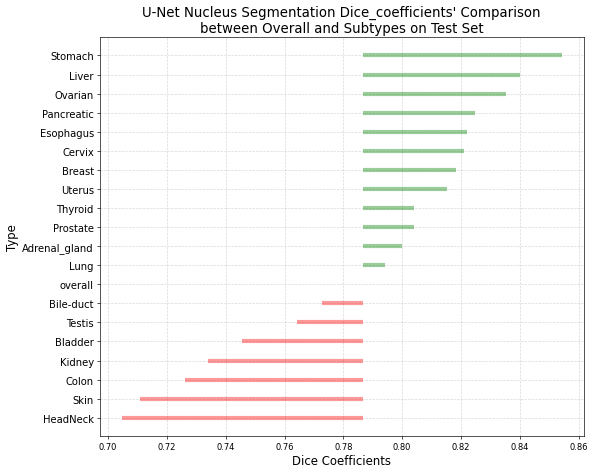

In [21]:
import pandas as pd
dice_df=pd.DataFrame(type_dices4,index=[0]).T.reset_index()
dice_df=dice_df.rename(columns={'index':'type',0:'dice_coef'})
dice_df=dice_df.append(pd.DataFrame({'type':'overall','dice_coef':total_dice4/test_n},index=[0]))
dice_df
x = dice_df['dice_coef']
overall = total_dice4/test_n
dice_df['colors'] = ['red' if x < overall else 'green' for x in dice_df['dice_coef']]
dice_df.sort_values('dice_coef', inplace=True)


# Draw plot
plt.figure(figsize=(10,8), dpi= 60)
plt.hlines(y=dice_df['type'], xmin=overall, xmax=dice_df.dice_coef, color=dice_df.colors, alpha=0.4, linewidth=5)

plt.ylabel('Type', fontsize=14)
plt.xlabel('Dice Coefficients',fontsize=14)
plt.yticks(dice_df.type,fontsize=12)
plt.title('U-Net Nucleus Segmentation Dice_coefficients\' Comparison\nbetween Overall and Subtypes on Test Set', fontdict={'size':16})
plt.grid(linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('subtype comparison4.png')

## plot prediction on test set

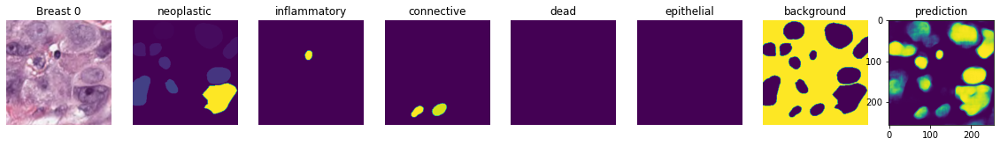

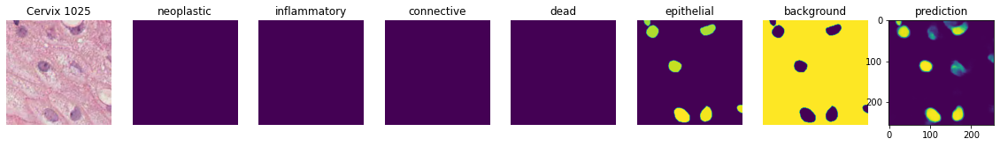

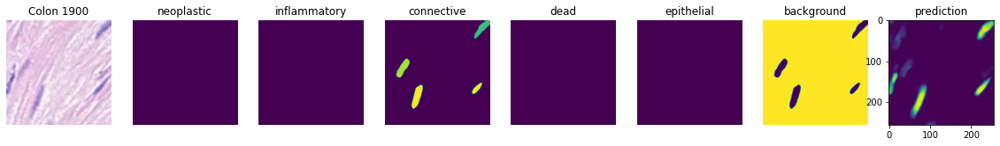

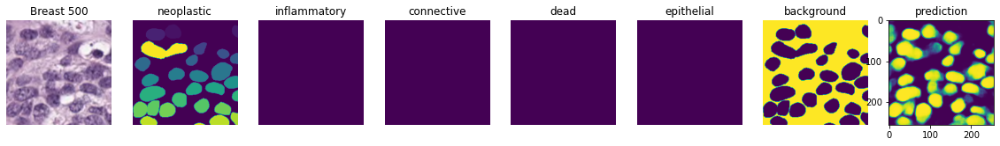

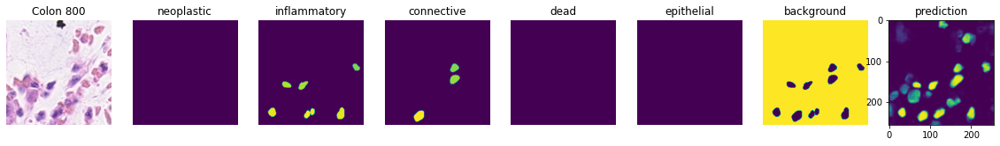

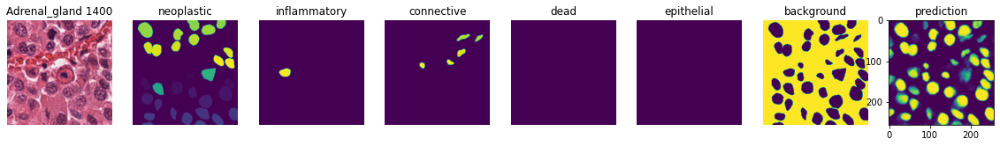

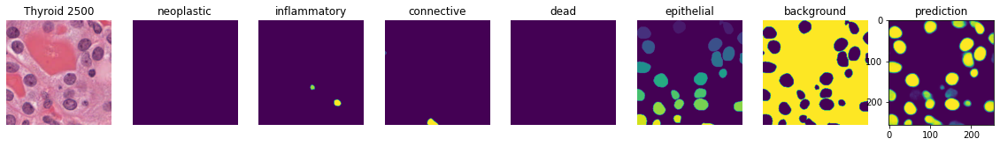

In [27]:
maskNames = ["neoplastic", "inflammatory", "connective", "dead", "epithelial", "background"]
def plot_images_mask(i, images, masks, figsize = (20,10)):
    global maskNames
    global types_3
    plt.figure(figsize=figsize)
    plt.subplot(131)
    plt.imshow(images[i])
    plt.title(types_3[i] + " " + str(i))
    plt.axis("off")
    

    plt.subplot(132)
    plt.imshow(masks[i,:,:,5])
    plt.title(maskNames[5])
    plt.axis("off")
    plt.subplot(133)
    plt.imshow(pred4[i,:,:,:])
    plt.title('prediction')
    plt.show()

for i in [0,1025,1900,500,800,1400,2500]:
    plot_images_mask(i, images_3, masks_3)
#fig,ax=plt.subplots(6,3)

In [28]:
pred_train4 = model4.predict(train_x,verbose=1)
train_n=len(train_y)
total_train_dice4=0
for i in range(train_n):
    total_train_dice4+=dice_coef_numpy(train_y[i],pred_train4[i])
print(total_train_dice4/train_n)

83/83 [==============================] - 106s 1s/step
0.82742414212314


In [29]:
print('The predicted dice coefficient on train set is {0:.4f}'.format(total_train_dice4/train_n))
print('The predicted dice coefficient on test set is {0:.4f}'.format(total_dice4/test_n))

The predicted dice coefficient on train set is 0.8274
The predicted dice coefficient on test set is 0.7868


## Compare with prediction with train set --> no overfitting

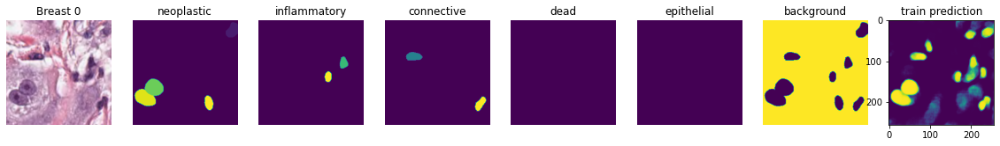

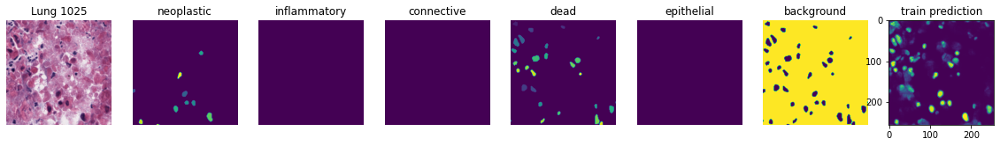

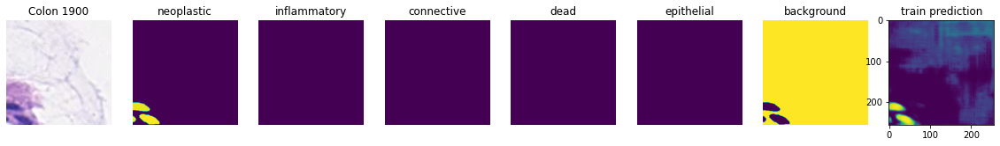

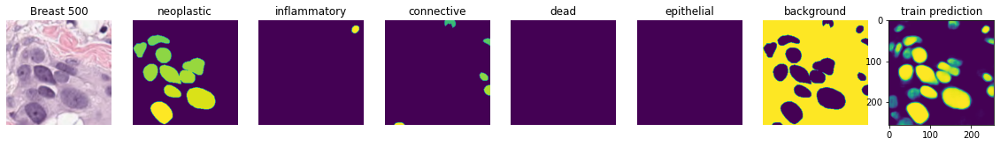

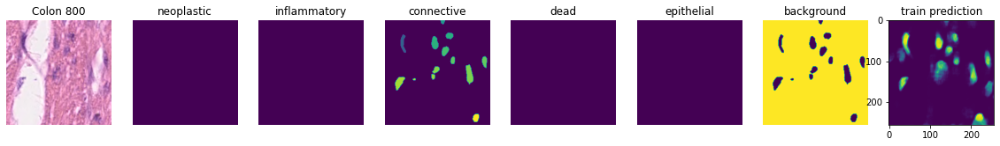

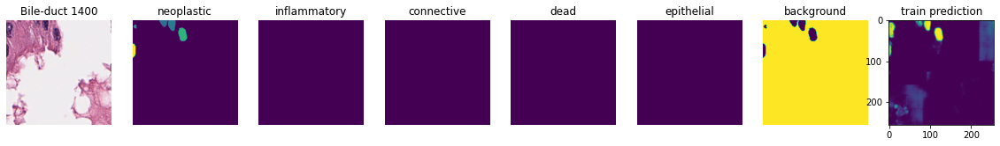

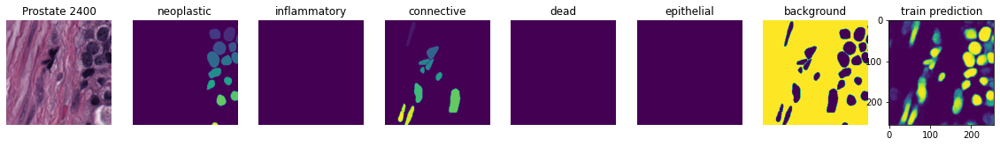

In [32]:
maskNames = ["neoplastic", "inflammatory", "connective", "dead", "epithelial", "background"]
def plot_images_train_mask(i, images, masks, figsize = (20,10)):
    global maskNames
    global types_1
    plt.figure(figsize=figsize)
    plt.subplot(181)
    plt.imshow(images[i])
    plt.title(types_1[i] + " " + str(i))
    plt.axis("off")
    
    for j in range(6):
        plt.subplot(182+j)
        plt.imshow(masks[i,:,:,j])
        plt.title(maskNames[j])
        plt.axis("off")
    plt.subplot(188)
    plt.imshow(pred_train4[i,:,:,:])
    plt.title('train prediction')
    plt.show()

for i in [0,1025,1900,500,800,1400,2400]:
    plot_images_train_mask(i, images_1, masks_1)

## examine type balance

In [59]:
tt=pd.concat([pd.Series(types_1).value_counts(),pd.Series(types_2).value_counts()],axis=1).rename(columns={0:'train set',1:'validation set'})
tt=pd.concat([tt,pd.Series(types_3).value_counts()],axis=1).rename(columns={0:'test set'})
tt

,train set,validation set,test set
Breast,827,749,775
Colon,478,468,494
Bile-duct,159,103,158
Esophagus,155,128,141
Cervix,155,52,86
Adrenal_gland,134,148,155
Thyroid,80,84,62
Lung,80,53,51
Pancreatic,78,89,28
Prostate,77,37,68


## examine best/worst 3 types

In [93]:
stomach_train_index=types_1=='Stomach'
stomach_test_index=types_3=='Stomach'
liver_train_index=types_1=='Liver'
liver_test_index=types_3=='Liver'
ovarian_train_index=types_1=='Ovarian'
ovarian_test_index=types_3=='Ovarian'

headneck_train_index=types_1=='HeadNeck'
headneck_test_index=types_3=='HeadNeck'
skin_train_index=types_1=='Skin'
skin_test_index=types_3=='Skin'
colon_train_index=types_1=='Colon'
colon_test_index=types_3=='Colon'

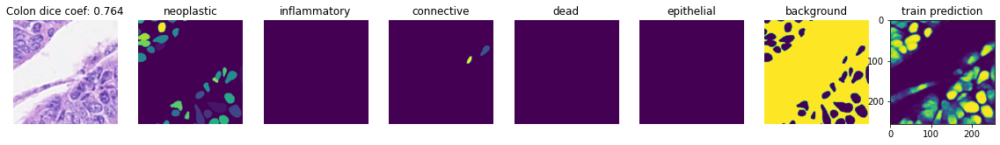

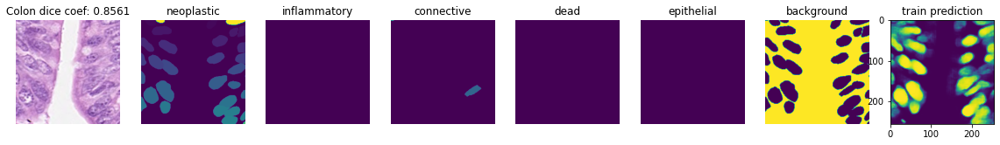

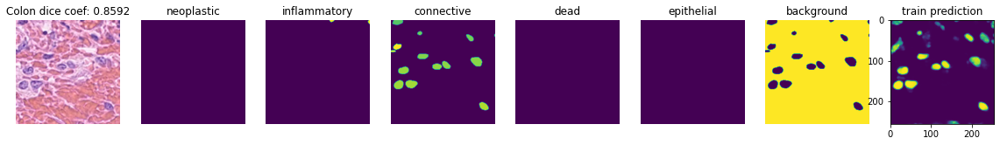

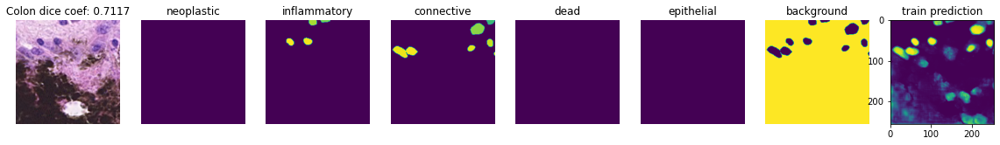

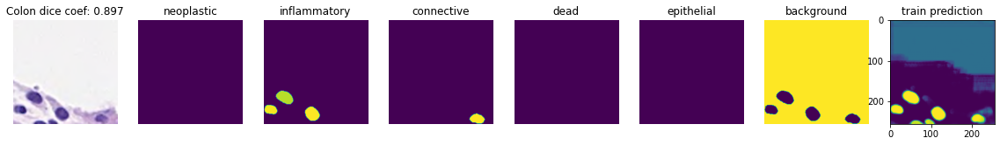

...

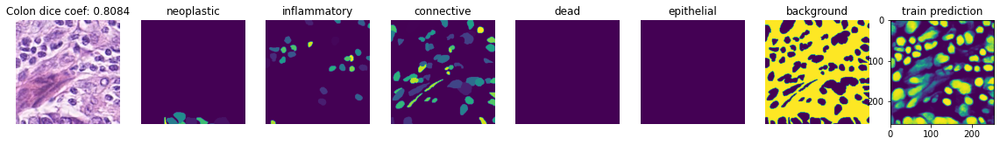

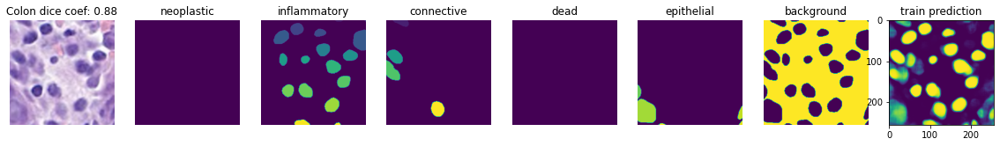

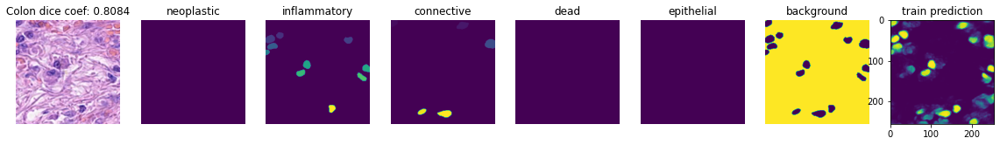

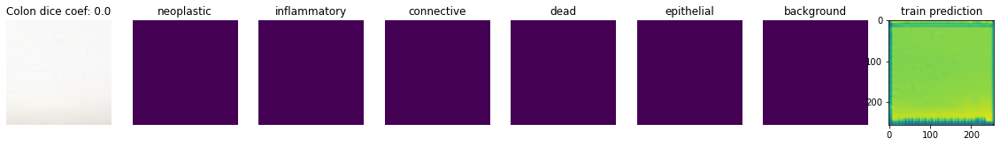

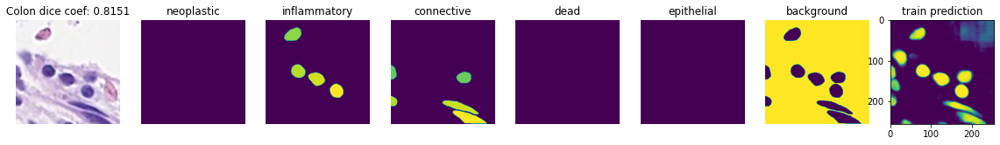

In [86]:
maskNames = ["neoplastic", "inflammatory", "connective", "dead", "epithelial", "background"]
def plot_images_train_sub_mask(i, images, masks, figsize = (20,10)):
    global maskNames
    global types_1
    plt.figure(figsize=figsize)
    plt.subplot(181)
    plt.imshow(images[i])
    dice=dice_coef_numpy(train_y[i],pred_train4[i])
    plt.title(types_1[i] + " dice coef: " + str(np.round(dice,4)))
    plt.axis("off")
    
    for j in range(6):
        plt.subplot(182+j)
        plt.imshow(masks[i,:,:,j])
        plt.title(maskNames[j])
        plt.axis("off")
    plt.subplot(188)
    plt.imshow(pred_train4[i,:,:,:])
    plt.title('train prediction')
    #plt.show()
    plt.savefig('./data/'+types_1[i]+str(i)+'_train.png')

for i in random.choice(np.where(colon_train_index)[0],20,replace=False):
    plot_images_train_sub_mask(i, images_1, masks_1)


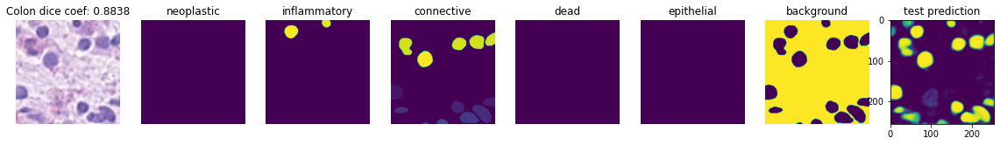

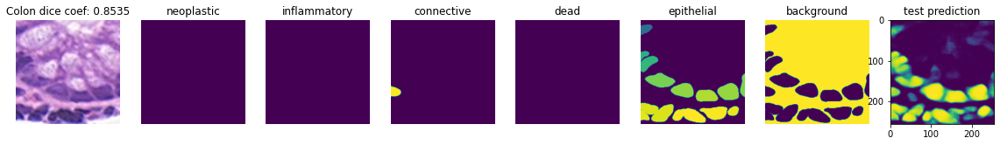

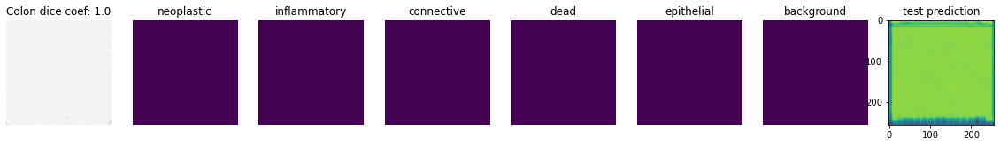

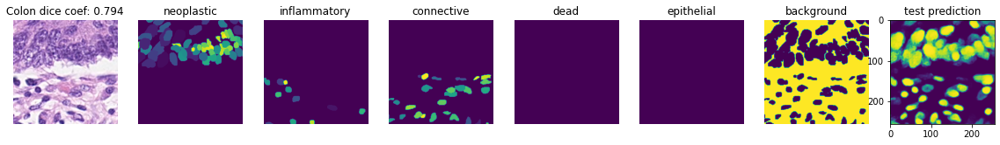

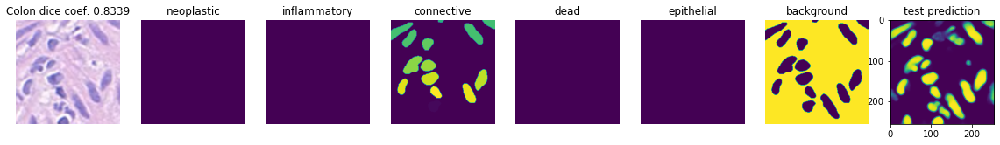

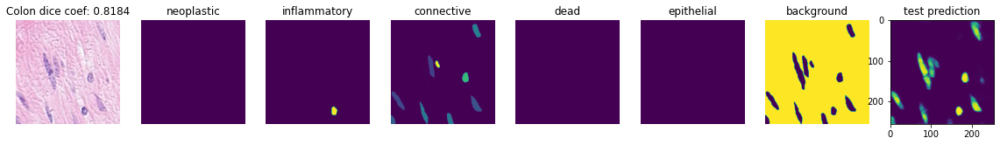

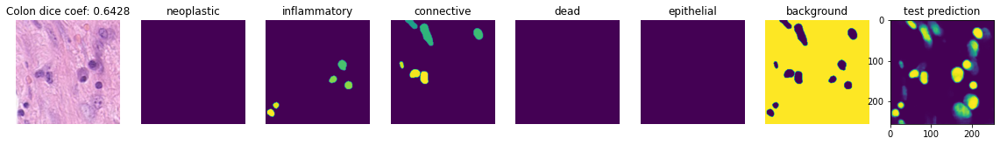

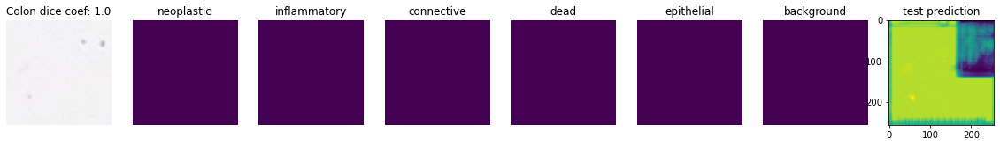

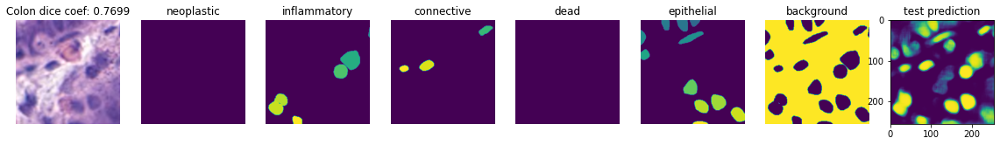

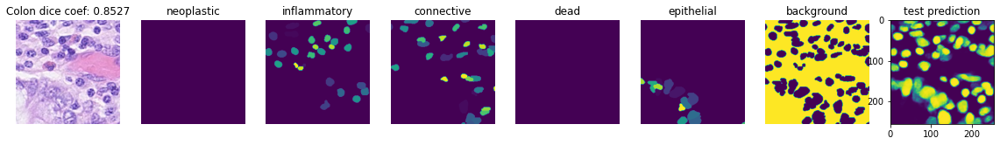

In [91]:
def plot_images_sub_mask(i, images, masks, figsize = (20,10)):
    global maskNames
    global types_3
    plt.figure(figsize=figsize)
    plt.subplot(181)
    plt.imshow(images[i])
    dice=dice_coef_numpy(test_y[i],pred4[i])
    plt.title(types_3[i] + " dice coef: " + str(np.round(dice,4)))
    plt.axis("off")
    
    for j in range(6):
        plt.subplot(182+j)
        plt.imshow(masks[i,:,:,j])
        plt.title(maskNames[j])
        plt.axis("off")
    plt.subplot(188)
    plt.imshow(pred4[i,:,:,:])
    plt.title('test prediction')
    #plt.show()
    plt.savefig('./data/'+types_3[i]+str(i)+'_test.png')
for i in random.choice(np.where(colon_test_index)[0],10,replace=False):
    plot_images_sub_mask(i, images_3, masks_3)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


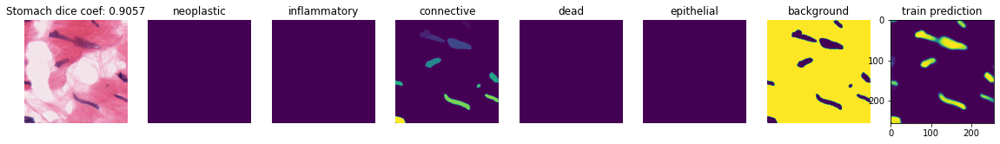

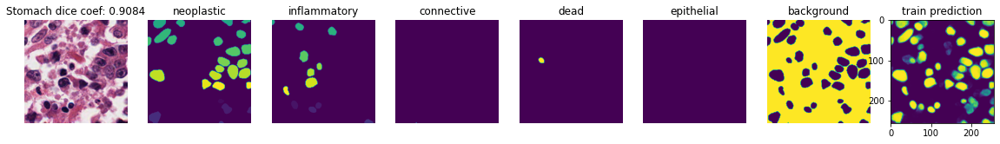

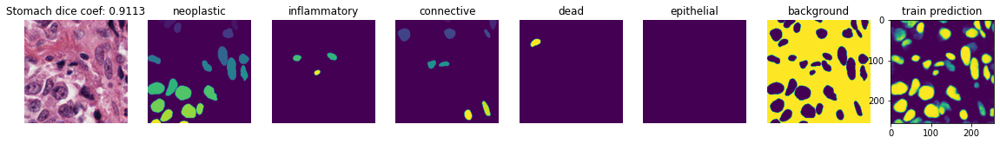

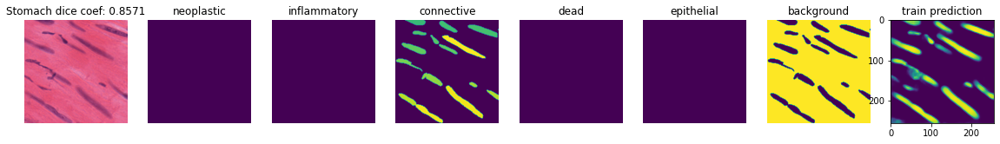

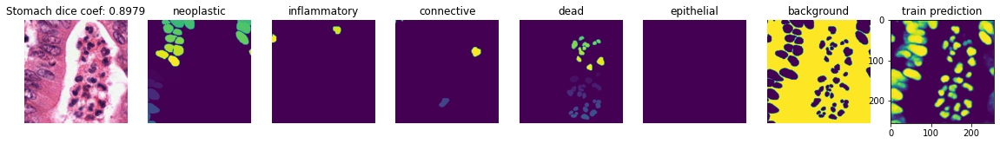

...

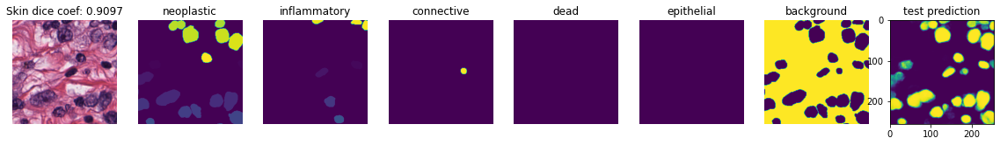

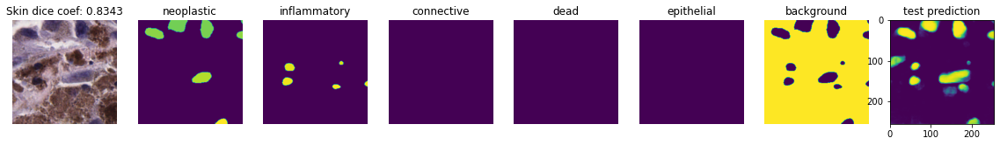

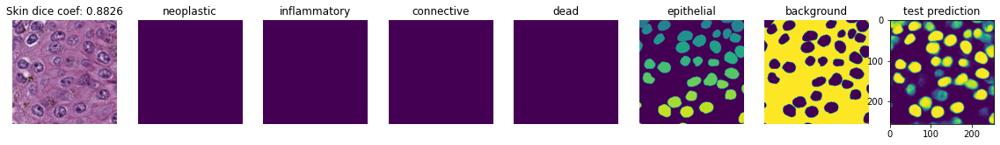

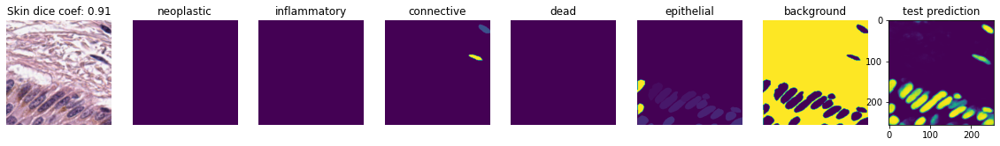

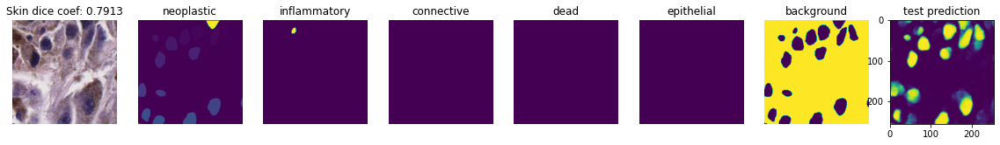

In [95]:
train_list=[stomach_train_index,liver_train_index,ovarian_train_index,headneck_train_index,skin_train_index]
test_list=[stomach_test_index,liver_test_index,ovarian_test_index,headneck_test_index,skin_test_index]
for types in train_list:
    for i in random.choice(np.where(types)[0],10,replace=False):
        plot_images_train_sub_mask(i, images_1, masks_1)
for types in test_list:
    for i in random.choice(np.where(types)[0],10,replace=False):
        plot_images_sub_mask(i, images_3, masks_3)

## Redefine unet4 (the best model) to test the effect of sample size

In [98]:
opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

# Use earlystopping to speed it up, if the validation loss are the same for 10 epochs, then stop
import tensorflow as tf
callback=tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=10, verbose=0, mode='auto',
    baseline=None, restore_best_weights=False
)

# split to 2 parts, we try 0.4-0.9 first 
percs=np.linspace(0.4,0.9,6)
n_trains = [int(i*nox) for i in percs]
train_loss,val_loss,train_dice,val_dice={},{},{},{}
for i,n in enumerate(n_trains):
    x_train = train_x[0:n]
    x_val   = val_x
    y_train = train_y[0:n]
    y_val   = val_y
 
    model = unet()
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=[dice_coef])
    history = model.fit(x_train, y_train, steps_per_epoch = n_train//32, batch_size = 32, callbacks=[callback],
                        epochs =100, shuffle=True, initial_epoch=0, validation_data = (x_val, y_val))
    tra_loss1 = history.history['loss']
    tra_dice_coef = history.history['dice_coef']
    val_loss1 = history.history['val_loss']
    val_dice_coef = history.history['val_dice_coef']
    train_loss[n]=tra_loss1
    train_dice[n]=tra_dice_coef
    val_loss[n]=val_loss1
    val_dice[n]=val_dice_coef

    epochs1 = range(1, len(tra_dice_coef)+1)
    end_epoch1 = len(tra_dice_coef)

    opt_epoch1 = val_loss1.index(min(val_loss1)) + 1

    opt_val_loss1 = val_loss1[opt_epoch1-1]
    opt_val_dice_coef = val_dice_coef[opt_epoch1-1]
    print('Model {}'.format(i))
    print("Epoch: {0}".format(opt_epoch1))
    print("Valid dice coef: {0:.4f}".format(opt_val_dice_coef))
    print("Valid loss: {0:.4f}".format(opt_val_loss1))
    

Epoch 1/100
58/58 [==============================] - 448s 8s/step - loss: 0.3012 - dice_coef: 0.4907 - val_loss: 0.3722 - val_dice_coef: 0.5308
Epoch 2/100
58/58 [==============================] - 431s 7s/step - loss: 0.2506 - dice_coef: 0.5806 - val_loss: 0.3573 - val_dice_coef: 0.5606
Epoch 3/100
58/58 [==============================] - 457s 8s/step - loss: 0.2322 - dice_coef: 0.6016 - val_loss: 0.3432 - val_dice_coef: 0.5506
Epoch 4/100
58/58 [==============================] - 456s 8s/step - loss: 0.2193 - dice_coef: 0.6257 - val_loss: 0.3414 - val_dice_coef: 0.5843
Epoch 5/100
58/58 [==============================] - 466s 8s/step - loss: 0.2102 - dice_coef: 0.6421 - val_loss: 0.3357 - val_dice_coef: 0.5751
Epoch 6/100
58/58 [==============================] - 467s 8s/step - loss: 0.2031 - dice_coef: 0.6528 - val_loss: 0.3463 - val_dice_coef: 0.6243
Epoch 7/100
58/58 [==============================] - 476s 8s/step - loss: 0.1963 - dice_coef: 0.6655 - val_loss: 0.3449 - val_dice_coef:

0.5


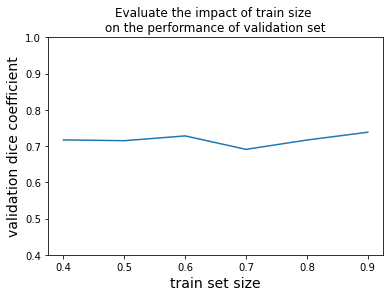

In [104]:
plt.plot(percs,best_dice)
plt.xticks(percs)
plt.ylim((0.4,1))
plt.xlabel('train set size',fontsize=14)
plt.ylabel('validation dice coefficient',fontsize=14)
plt.title('Evaluate the impact of train size \non the performance of validation set')
plt.savefig('./data/trainsize.png')
print(1328/images_1.shape[0])

In [105]:
best_dice


[0.7170446515083313,
 0.7148829698562622,
 0.7280711531639099,
 0.6909615993499756,
 0.7166716456413269,
 0.7382460236549377]

In [106]:
percs

array([0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

## Try smaller percentages

In [10]:
percs=np.linspace(0.1,0.4,4)
n_trains = [int(i*nox) for i in percs]
train_loss,val_loss,train_dice,val_dice={},{},{},{}
for i,n in enumerate(n_trains):
    x_train = train_x[0:n]
    x_val   = val_x
    y_train = train_y[0:n]
    y_val   = val_y
 
    model = unet()
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=[dice_coef])
    history = model.fit(x_train, y_train, steps_per_epoch = n_train//32, batch_size = 32, callbacks=[callback],
                        epochs =100, shuffle=True, initial_epoch=0, validation_data = (x_val, y_val))
 
    tra_loss1 = history.history['loss']
    tra_dice_coef = history.history['dice_coef']
    val_loss1 = history.history['val_loss']
    val_dice_coef = history.history['val_dice_coef']
    train_loss[n]=tra_loss1
    train_dice[n]=tra_dice_coef
    val_loss[n]=val_loss1
    val_dice[n]=val_dice_coef

    epochs1 = range(1, len(tra_dice_coef)+1)
    end_epoch1 = len(tra_dice_coef)

    opt_epoch1 = val_loss1.index(min(val_loss1)) + 1

    opt_val_loss1 = val_loss1[opt_epoch1-1]
    opt_val_dice_coef = val_dice_coef[opt_epoch1-1]
    print('Model {}'.format(i))
    print("Epoch: {0}".format(opt_epoch1))
    print("Valid dice coef: {0:.4f}".format(opt_val_dice_coef))
    print("Valid loss: {0:.4f}".format(opt_val_loss1))
    

Epoch 1/100
58/58 [==============================] - 457s 8s/step - loss: 0.2754 - dice_coef: 0.5350 - val_loss: 0.4951 - val_dice_coef: 0.5038
Epoch 2/100
58/58 [==============================] - 455s 8s/step - loss: 0.2003 - dice_coef: 0.6488 - val_loss: 0.4260 - val_dice_coef: 0.5026
Epoch 3/100
58/58 [==============================] - 439s 8s/step - loss: 0.1826 - dice_coef: 0.6796 - val_loss: 0.3604 - val_dice_coef: 0.5469
Epoch 4/100
58/58 [==============================] - 450s 8s/step - loss: 0.1743 - dice_coef: 0.6932 - val_loss: 0.3400 - val_dice_coef: 0.5351
Epoch 5/100
58/58 [==============================] - 435s 7s/step - loss: 0.1644 - dice_coef: 0.7074 - val_loss: 0.3702 - val_dice_coef: 0.5489
Epoch 6/100
58/58 [==============================] - 455s 8s/step - loss: 0.1580 - dice_coef: 0.7186 - val_loss: 0.3738 - val_dice_coef: 0.5888
Epoch 7/100
58/58 [==============================] - 452s 8s/step - loss: 0.1520 - dice_coef: 0.7315 - val_loss: 0.4083 - val_dice_coef:

0.5


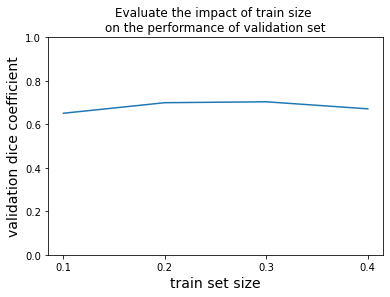

In [12]:
ns=list(train_loss.keys())
best_dice=[]
for i in ns:
    best_dice.append(max(val_dice[i]))

plt.plot(percs,best_dice)
plt.xticks(percs)
plt.ylim((0,1))
plt.xlabel('train set size',fontsize=14)
plt.ylabel('validation dice coefficient',fontsize=14)
plt.title('Evaluate the impact of train size \non the performance of validation set')
plt.savefig('./data/trainsize.png')
print(1328/images_1.shape[0])

In [13]:
best_dice.append([0.7170446515083313,
 0.7148829698562622,
 0.7280711531639099,
 0.6909615993499756,
 0.7166716456413269,
 0.7382460236549377])


[0.6509636044502258,
 0.699539840221405,
 0.7036679983139038,
 0.6713324189186096,
 [0.7170446515083313,
  0.7148829698562622,
  0.7280711531639099,
  0.6909615993499756,
  0.7166716456413269,
  0.7382460236549377]]

In [14]:
best_dice.pop(-1)

[0.7170446515083313,
 0.7148829698562622,
 0.7280711531639099,
 0.6909615993499756,
 0.7166716456413269,
 0.7382460236549377]

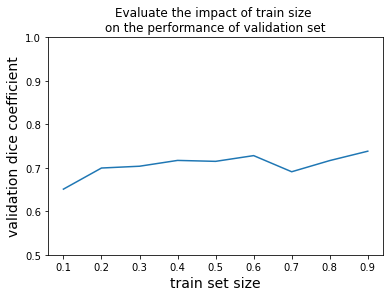

In [29]:
best_dice_all=best_dice[:3]+[0.7170446515083313,0.7148829698562622,
 0.7280711531639099,0.6909615993499756,0.7166716456413269,0.7382460236549377]
best_dice_all
size_all=np.linspace(0.1,0.9,9)
plt.plot(size_all,best_dice_all)
plt.xticks(size_all)
plt.ylim((0.5,1))
plt.xlabel('train set size',fontsize=14)
plt.ylabel('validation dice coefficient',fontsize=14)
plt.title('Evaluate the impact of train size \non the performance of validation set')
plt.savefig('./data/all_trainsize.png')
